In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an
import sklearn.metrics
from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn import preprocessing

In [2]:
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["font.family"] = "Arial"

In [3]:
#adata=sc.read(results_file_post)
#adata.uns['log1p'] = {"base":None}

In [4]:
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.3 anndata==0.10.7 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 python-igraph==0.10.4 pynndescent==0.5.12


In [5]:
%matplotlib inline

In [6]:
writeDir = "write/"

fileName = "DTAPlungMouse"

resultsFile = writeDir + fileName + '.h5ad'       # final output
resultsFileQC = writeDir + fileName + '_QC.h5ad'  # post QC (pre-analysis) 

In [7]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=150, fontsize=10, format='png')
sc.settings.figdir = "figures/" + fileName + "/"
figName = fileName

In [8]:
#adata=sc.read(results_file_post)
#adata.uns['log1p'] = {"base":None}

In [9]:
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.3 anndata==0.10.7 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 python-igraph==0.10.4 pynndescent==0.5.12


In [10]:
#%matplotlib inline

Set scanpy out-files

In [11]:
adata=sc.read_h5ad('data/DTAPlungMouse_all.h5ad')

In [12]:
adata = adata[np.logical_not(np.logical_or(adata.obs.leiden=="8",adata.obs.leiden=="9")),:]

In [13]:
adata = adata.raw.to_adata()
adata.uns['log1p']['base']=None
sc.pp.highly_variable_genes(adata, flavor = "seurat", n_top_genes=2000)
adata.raw=adata
adata = adata[:, np.logical_and(adata.var.highly_variable, np.logical_not(adata.var.mt))]
sc.tl.pca(adata, n_comps = 100, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.4)

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca


In [14]:
sc.tl.leiden(adata, resolution=0.6)

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

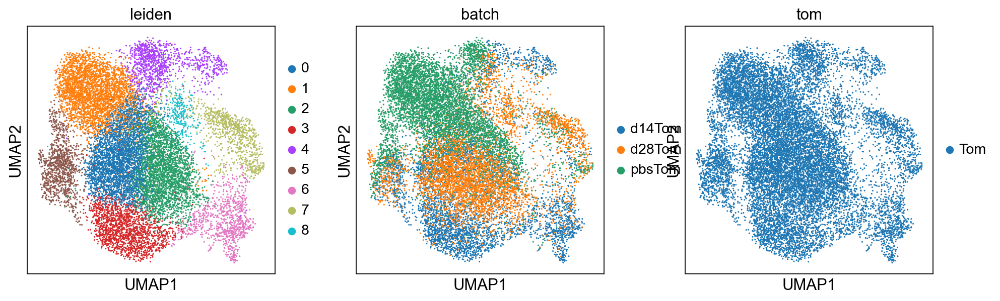

In [15]:
sc.pl.umap(adata, color=["leiden","batch","tom"],ncols=3)

In [16]:
dapt = np.array(["Cldn4","Krt8","Ndrg1","Sprr1a","Tnip3",
                 "Mif","Mdm2",
                 "Pold4","Ccnd1"
                 "Mboat1","Gdf15",
                 "AW112010","Trp53",
                 "Hif1a","Bax",
                 "Pdk4","Ifngr1",
                 "Cxx1b","Ly6a",
                 "Lrrc26","Irf7",
                 "Cdkn2a","Cxcl16",
                 "Cdkn1a","Timp1"])

sc.tl.score_genes(adata, dapt, score_name="dapt")

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

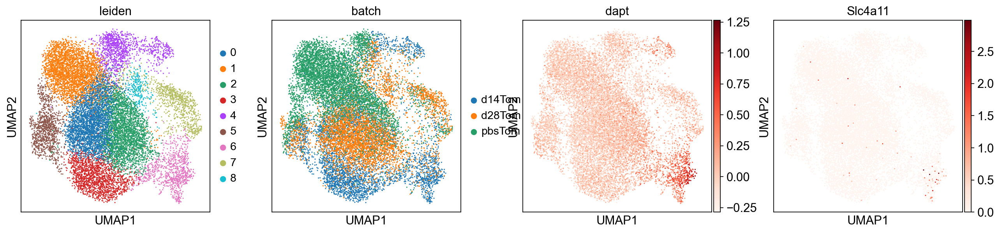

In [17]:
sc.pl.umap(adata, color=["leiden","batch","dapt","Slc4a11"],ncols=4, cmap="Reds")

In [18]:
#sc.pl.umap(adata[adata.obs.leiden=="3",:], color=["leiden","batch","dapt","Slc4a11"],ncols=4, cmap="Reds")

In [ ]:
sigGenes = pd.read_table("geneSigs/LUAD/datp_jhlee_GS.tsv",sep="\t")

In [32]:
for gs in sigGenes:
    sc.tl.score_genes(adata, sigGenes[gs].dropna().values, score_name=gs)

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


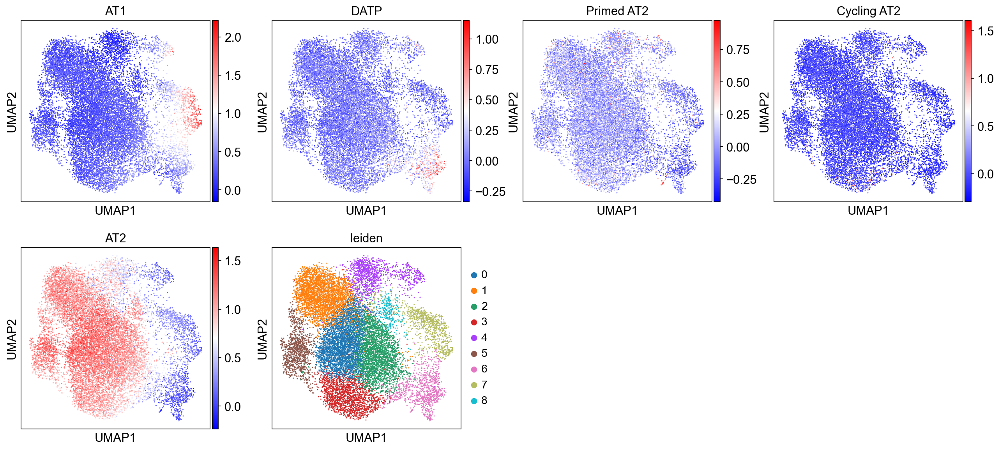

In [33]:
sc.pl.umap(adata, color=list(sigGenes.columns)+["leiden"],cmap="bwr")

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


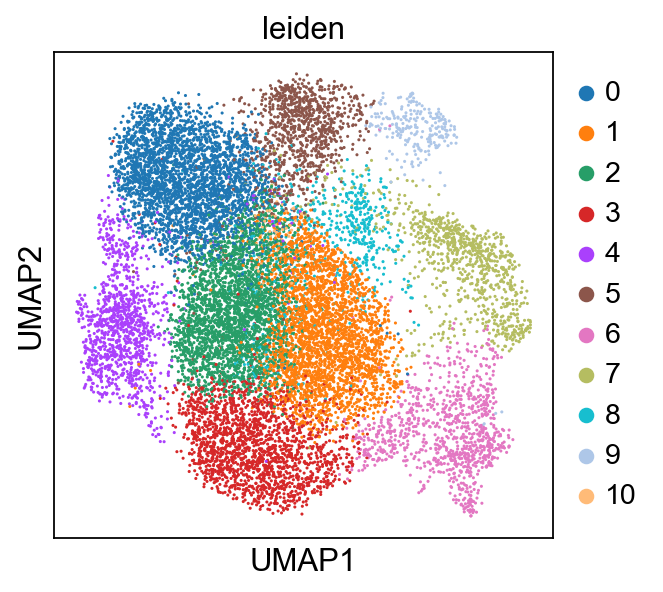

In [34]:
sc.tl.leiden(adata, resolution=1)
sc.pl.umap(adata, color=["leiden"])

In [35]:
lidCsDict={
    "0":"AT2",
    "1":"AT2",
    "2":"AT2",
    "3":"Cycling AT2",
    "4":"AT2",
    "5":"AT2",
    "6":"DATP",
    "7":"AT1",
    "8":"AT2",
    "9":"Primed AT2",
    "10":"AT2"
}
adata.obs["cellstate"] = [lidCsDict[l] for l in adata.obs.leiden]

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

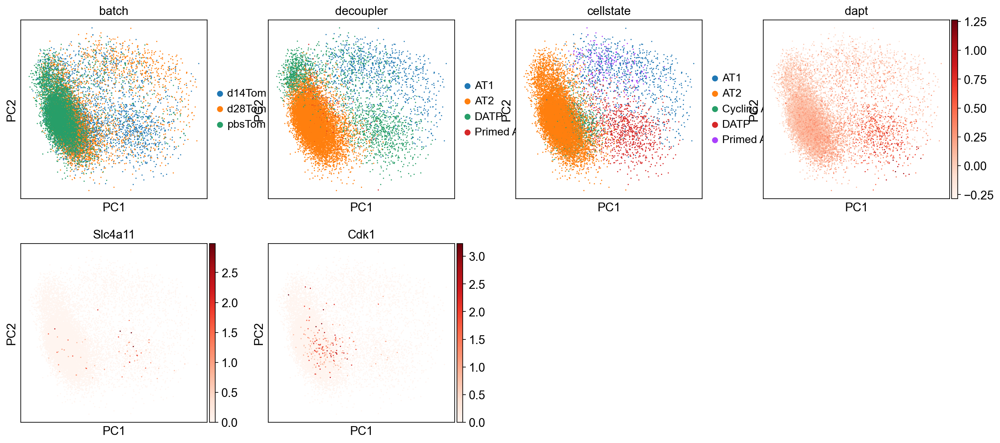

In [36]:
sc.pl.pca(adata, color=["batch","decoupler","cellstate","dapt","Slc4a11","Cdk1"],ncols=4, cmap="Reds")

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

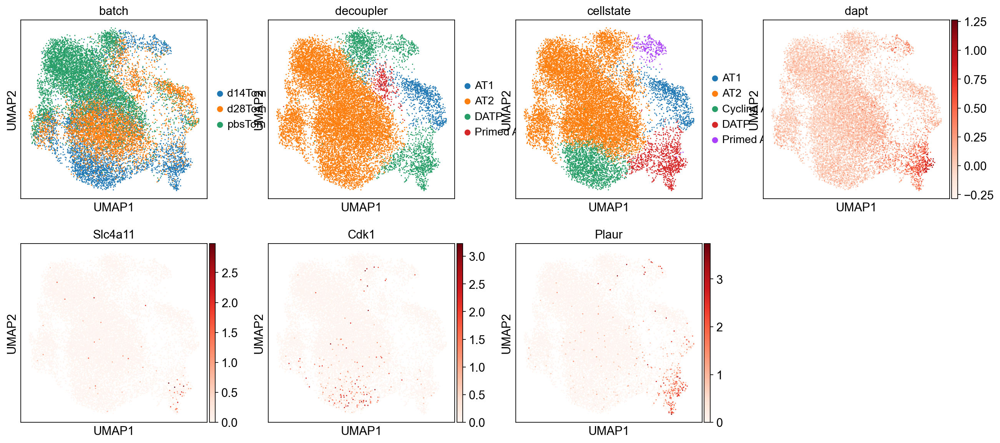

In [37]:
sc.pl.umap(adata, color=["batch","decoupler","cellstate","dapt","Slc4a11","Plaur"],ncols=4, cmap="Reds")

In [38]:
marker_genes = ["Sftpa1","Sftpc","Soat1","Lpcat1",
               "Etv5","Abca3","Cebpa","Acly","Cpm","Nr4a1",
               "Lcn2","Cxcl17","Lrg1","Itga7","Ptges","Glrx",
               "Cdk1","Mki67",
               "Cldn4","Krt8","Cdkn1a","Ndrg1","Sprr1a","Tnip3","Ly6a",
               "Pdpn","Hopx","Cav1"]

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' 

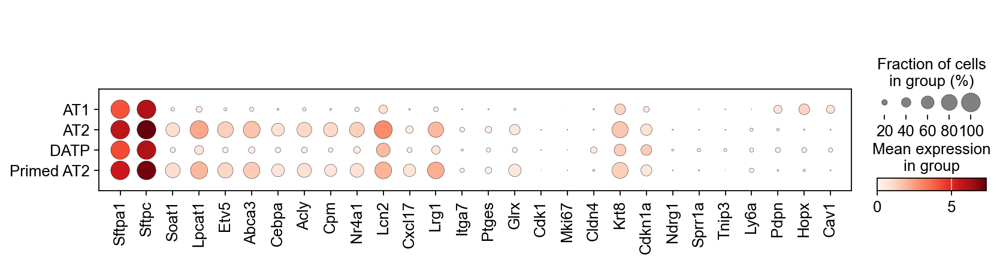

In [39]:
sc.pl.dotplot(adata, marker_genes, groupby="decoupler")

In [40]:
mhpcs = pd.read_csv("geneSigs/simpLUADcs.csv")["HPCS"].values[:250]
mhpcs

array(['Slc4a11', 'Il23a', 'Rrad', 'Tnf', 'Abtb2', 'Lif', 'Tnfrsf11b',
       'Tigit', 'Dusp10', 'Ntm', 'Trim15', 'Tm4sf1', 'Chac1', 'Creb5',
       '5031415H12Rik', 'Cxcl1', 'Mcpt8', 'Trp53inp1', 'Abcg1', 'Mapk11',
       'Klhl2', 'Il24', 'Zfand2a', 'Tspan5', 'Ddit3', 'Ascc3', 'Sgms2',
       'Grpel2', 'Gdf15', 'Dennd2c', 'Ly6a', 'Slc9a4', 'Asns', 'Ets1',
       'Ugcg', 'Gcnt2', 'Rnf19b', 'Pvt1', '3110043O21Rik', 'Cln8',
       'Hmces', 'Maff', 'Tnfaip3', 'Prkx', 'Tgfa', 'Pxdc1', 'Cdk17',
       'Slc1a4', 'Arid5a', 'Cldn4', 'Iars', 'Ptgs2', 'Relb', 'Mxd1',
       'Ppp1r13l', 'Btg1', 'Slc38a2', 'Sema7a', 'Smcr8', 'Cwh43', 'Aaed1',
       'B930095G15Rik', 'Pvr', 'Fbxo30', 'Zdhhc5', 'Chrnb1', 'Rhbdf2',
       'Fam50a', 'Cxcl16', 'Itga2', 'Hs3st1', 'Trib1', 'Tgif1', 'B3gnt2',
       'Rdh10', 'Rhob', 'Gm28048', 'Chmp4c', 'Chic2', 'Klf6', 'Bcl10',
       '2610035D17Rik', 'Gm10157', 'Cars', 'Bax', 'Agap1', 'Llph-ps2',
       'Otud4', 'Prkca', 'AI413582', 'Procr', '9930111J21Rik1', 'Fam83g',


In [41]:
from scipy.stats import gaussian_kde

def plotScatter(df, xLabel, yLabel, name, save=False):
    xVal, yVal = adata.obs[xLabel].values, adata.obs[yLabel].values
    m, b, r_value, p_value, std_err = stats.linregress(xVal, yVal)

    # Calculate the point density
    xy = np.vstack([xVal,yVal])
    densityColor = gaussian_kde(xy)(xy)
    
    # Sort the points by density, so that the densest points are plotted last
    idx = densityColor.argsort()
    xVal, yVal, densityColor = xVal[idx], yVal[idx], densityColor[idx]
    
    fig, ax = plt.subplots()
    ax.grid(False)
    ax_ = ax.scatter(xVal,yVal, c=densityColor,s=10)
    ax.plot(xVal, m*xVal + b, c="red")
    ax.annotate(f"r^2: {r_value**2:.2f}", xy=(-0.05,np.max(yVal)*0.95))
    ax.annotate(f"pVal: {p_value:.2f}", xy=(-0.05,np.max(yVal)*0.9))

    ax.set_xlabel(xLabel)
    ax.set_ylabel(yLabel)
    ax.set_title(name)
    plt.colorbar(ax_)
    plt.show()
    if(save):
        fig.savefig(f"figures/{name}_{xLabel}{yLabel}_scatter.svg")

In [42]:
def plotBoxPlot(dataDF, label, geneExp, gene, name, save=False):
    slcPos = adata.obs[label].values[geneExp]
    slcNeg = adata.obs[label].values[np.logical_not(geneExp)]

    # Create a figure and axis
    fig, ax = plt.subplots()
    ax.grid(False)
    # Create box plots
    box1 = ax.violinplot(slcPos, positions=[1], showmeans=True, widths=0.6)
    box2 = ax.violinplot(slcNeg, positions=[2], showmeans=True, widths=0.6)
    
    # Perform a t-test to get the p-value
    t_stat, p_val = stats.ttest_ind(slcPos, slcNeg)
    
    # Add p-value bracket and stars to the plot
    x1, x2 = 1, 2
    y, h, col = max(np.max(slcPos), np.max(slcNeg)), 0.1, 'k'
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
    ax.text((x1+x2)*.5, y+h-0.1, f'{p_val:.3e}', ha='center', va='bottom', color=col)
    
    # Add stars based on p-value significance
    if p_val < 0.001:
        stars = '***'
    elif p_val < 0.01:
        stars = '**'
    elif p_val < 0.05:
        stars = '*'
    else:
        stars = 'ns'  # not significant
    
    ax.text((x1+x2)*.5, y+h, stars, ha='center', va='bottom', color=col)
    
    # Add p-value text to the plot
    #plt.text(1.5, max(np.max(slcPos), np.max(slcNeg)), f'p-value: {p_val:.3e}', ha='center')
    
    # Set x-axis labels
    ax.set_xticks([1, 2])
    ax.set_xticklabels([f'{gene}+', f'{gene}-'])
    
    # Set title and labels
    ax.set_title(name)
    ax.set_ylabel(f'{label} Score')
    
    # Show the plot
    plt.show()
    if(save):
        fig.savefig(f"figures/{save}/{name}{label}_{gene}.svg")
    

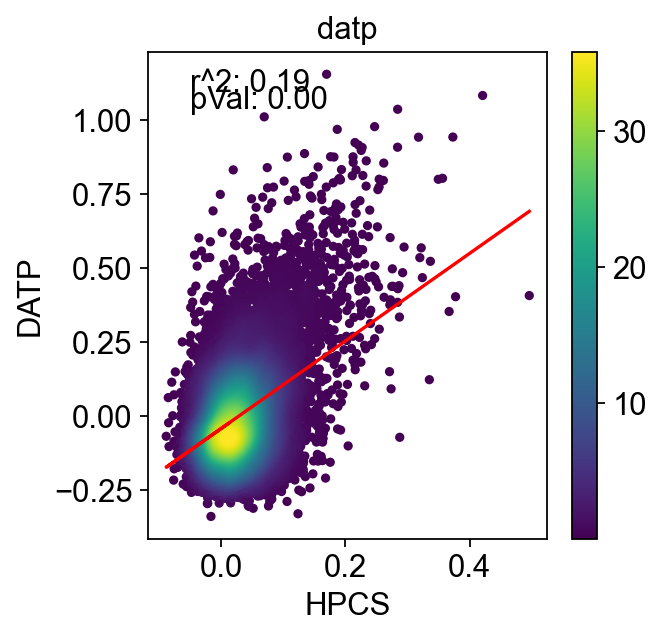

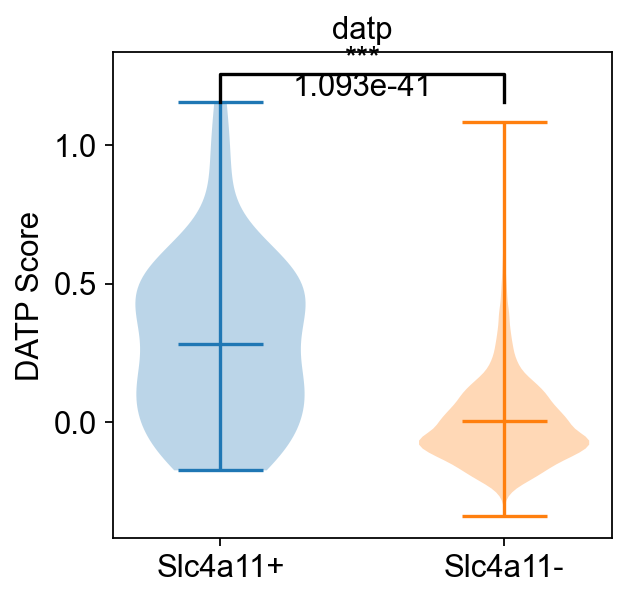

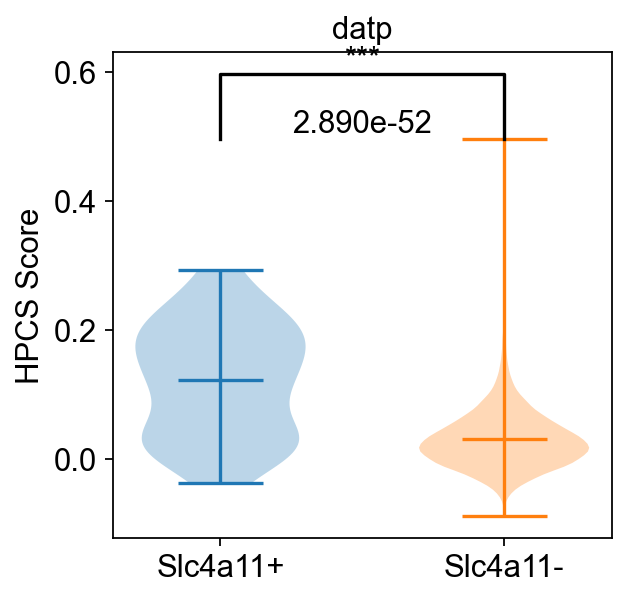

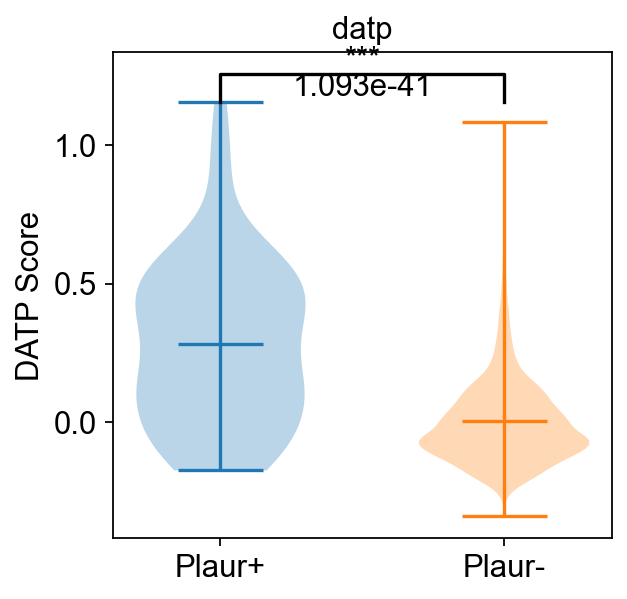

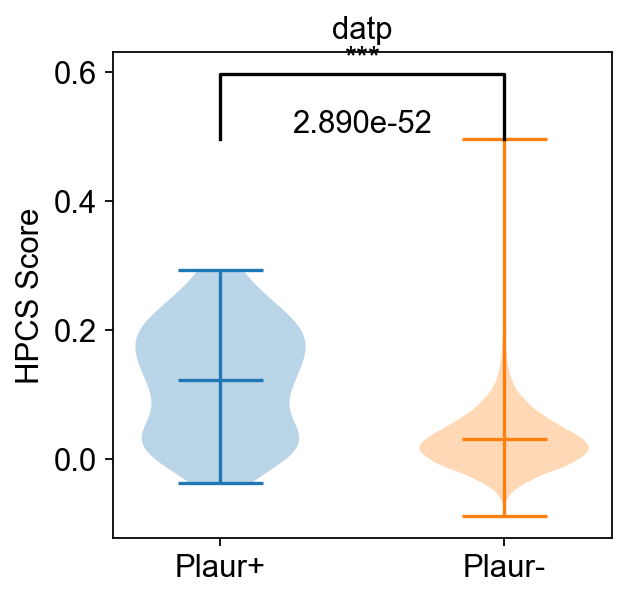

In [43]:
sc.tl.score_genes(adata, mhpcs, score_name="HPCS")
key="datp"
plotScatter(adata.obs, "HPCS", "DATP", key)
rdata = adata.raw.to_adata()
slc="Slc4a11"
if(isinstance(rdata.X, np.ndarray)):
    slcScore = np.array(rdata[:,rdata.var_names==slc].X).flatten() > 0
    parScore = np.array(rdata[:,rdata.var_names==slc].X).flatten() > 0
else:
    slcScore = np.array(rdata[:,rdata.var_names==slc].X.todense()).flatten() > 0
    parScore = np.array(rdata[:,rdata.var_names==slc].X.todense()).flatten() > 0

plotBoxPlot(adata.obs, "DATP", slcScore, slc, key, save="DTAPlungMouse")
plotBoxPlot(adata.obs, "HPCS", slcScore, slc, key, save="DTAPlungMouse")

plotBoxPlot(adata.obs, "DATP", parScore, "Plaur", key, save="DTAPlungMouse")
plotBoxPlot(adata.obs, "HPCS", parScore, "Plaur", key, save="DTAPlungMouse")

#sc.pl.umap(adata, color=["DATP"],cmap="Reds",size=30,vmin=0,
#           save=f"/../../../../plastic/figures/Final/{key}/Fig5_umap_datp_DATP.svg")
#sc.pl.umap(adata, color=["HPCS"],cmap="Reds",size=30,vmin=0,
#           save=f"/../../../../plastic/figures/Final/{key}/Fig5_umap_datp_HPCS.svg")

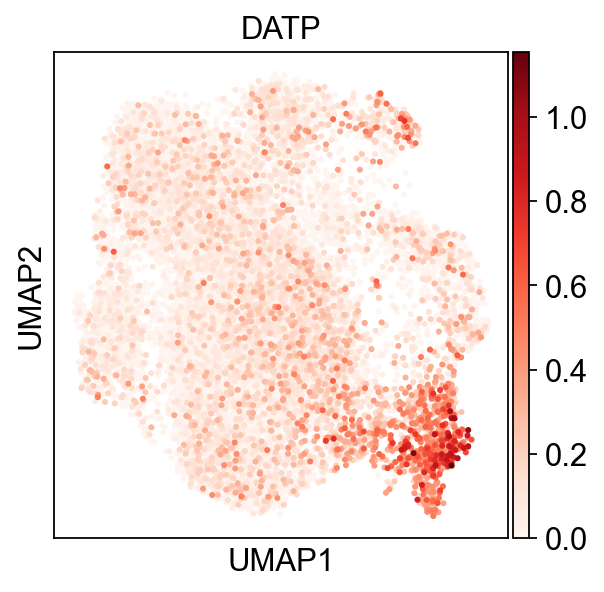

In [44]:
sc.pl.umap(adata, color=["DATP"],cmap="Reds",size=30,vmin=0,save=f"Fig5_umap_datp_DATP.svg")

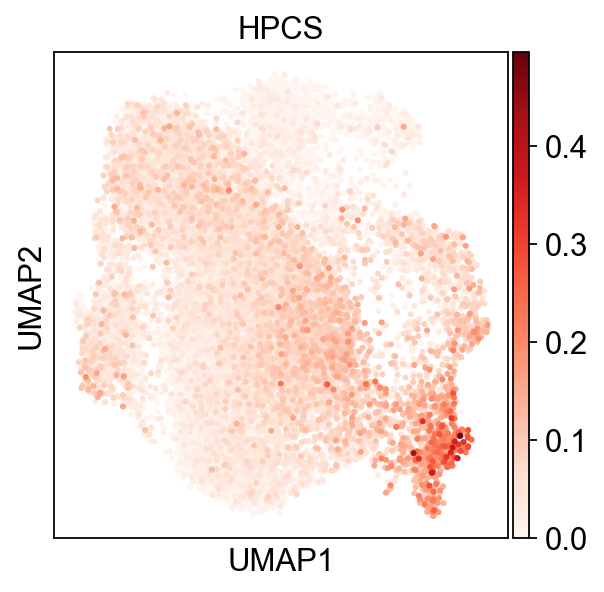

In [45]:
sc.pl.umap(adata, color=["HPCS"],cmap="Reds",size=30,vmin=0,save=f"Fig5_umap_datp_HPCS.svg")

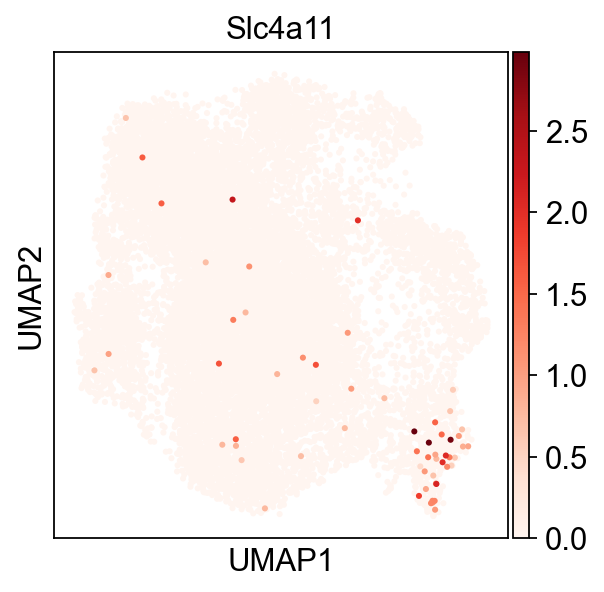

In [46]:
sc.pl.umap(adata, color=["Slc4a11"],cmap="Reds",size=30,save=f"Fig5_umap_datp_Slc4a11.svg")

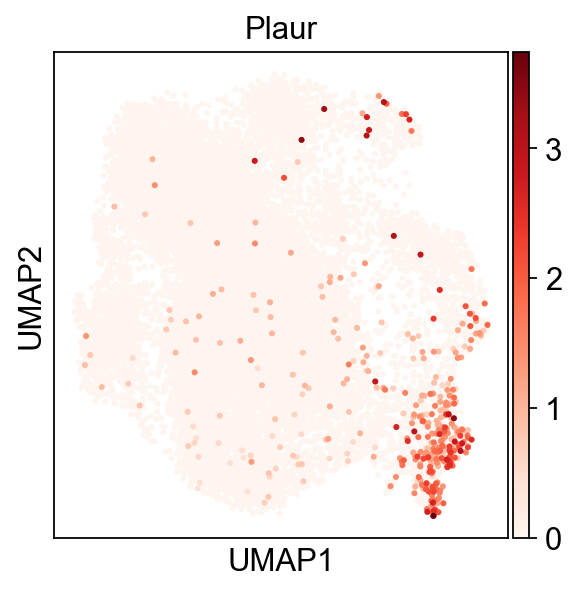

In [47]:
sc.pl.umap(adata, color=["Plaur"],cmap="Reds",size=30, save=f"Fig5_umap_datp_Plaur.svg")

/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jor4008/programs/miniconda3/envs/scsarc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


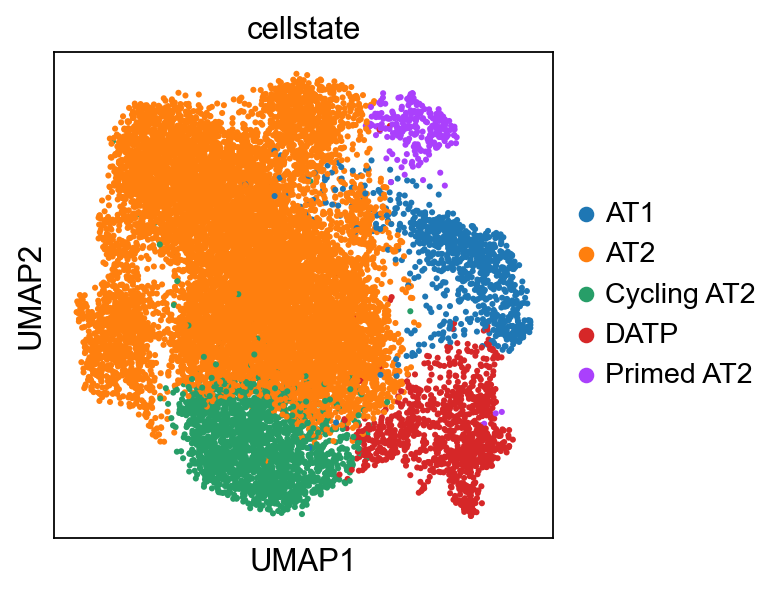

In [48]:
sc.pl.umap(adata, color=["cellstate"],cmap="Reds",size=30,save=f"Fig5_umap_datp_CellLabel.svg")

In [49]:
resultsFile

'write/DTAPlungMouse.h5ad'

In [50]:
adata.write(resultsFile)
adata

AnnData object with n_obs × n_vars = 15518 × 1997
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'tom', 'leiden', 'dapt', 'decoupler', 'AT1', 'DATP', 'Primed AT2', 'Cycling AT2', 'AT2', 'cellstate', 'HPCS'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'tom_colors', 'umap', 'dendrogram_leiden', 'decoupler_colors', 'cellstate_colors'
    obsm: 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [51]:
resultsFile

'write/DTAPlungMouse.h5ad'

In [52]:
allMarkAdi = pd.read_csv("geneGigs/LUAD/geneSigs/ADI.csv")
allMarkAdi

,gene,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,annotated cluster,cell type,meta cell type identity,Unnamed: 10
0,1100001G20Rik,0.000000,1.773489,0.540,0.106,0.0,0,AM (Bleo),Alveolar macrophages,Macrophages,NaN
1,Chi3l3,0.000000,1.769422,0.903,0.304,0.0,0,AM (Bleo),Alveolar macrophages,Macrophages,NaN
2,Car4,0.000000,1.528783,0.266,0.048,0.0,0,AM (Bleo),Alveolar macrophages,Macrophages,NaN
3,F7,0.000000,1.380656,0.423,0.124,0.0,0,AM (Bleo),Alveolar macrophages,Macrophages,NaN
4,Ctsk,0.000000,1.365012,0.284,0.069,0.0,0,AM (Bleo),Alveolar macrophages,Macrophages,NaN
...,...,...,...,...,...,...,...,...,...,...,...
14689,Capza2,0.002670,0.549463,1.000,0.251,1.0,42,unassigned,unassigned,unassigned,NaN
14690,Ifi27l2a,0.000429,0.507495,1.000,0.184,1.0,42,unassigned,unassigned,unassigned,NaN
14691,Slfn2,0.001464,0.494352,1.000,0.236,1.0,42,unassigned,unassigned,unassigned,NaN
14692,S100a10,0.003293,0.319792,1.000,0.336,1.0,42,unassigned,unassigned,unassigned,NaN


In [53]:
adi = allMarkAdi[allMarkAdi["annotated cluster"]=='Krt8+ ADI']["gene"][:250]
adi

5052              Clu
5053            Krt18
5054           Sprr1a
5055             Krt7
5056    2200002D01Rik
            ...      
5297           Tgoln1
5298            Abhd2
5299            Calm1
5300            Psmb1
5301           Golgb1
Name: gene, Length: 250, dtype: object

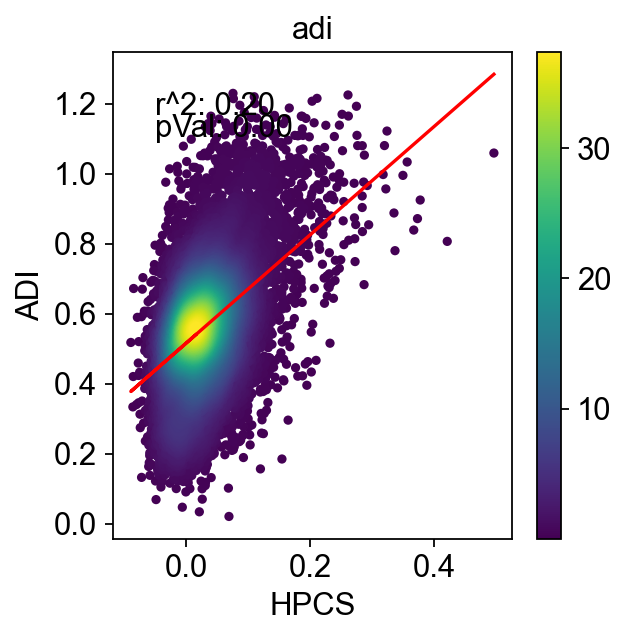

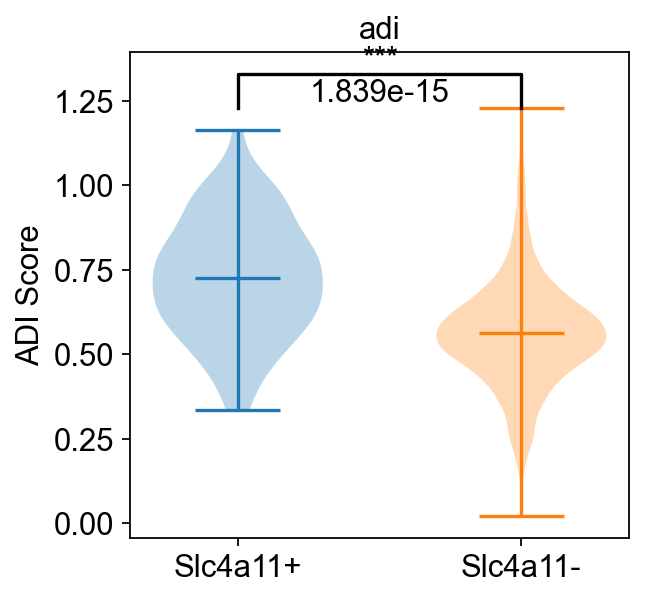

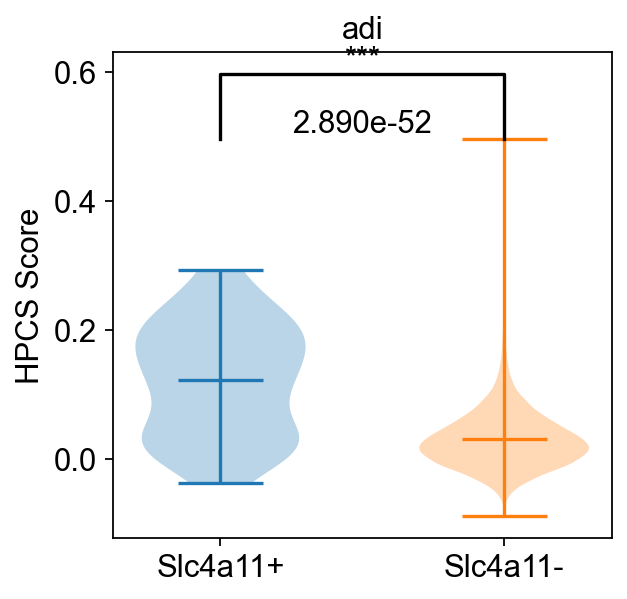

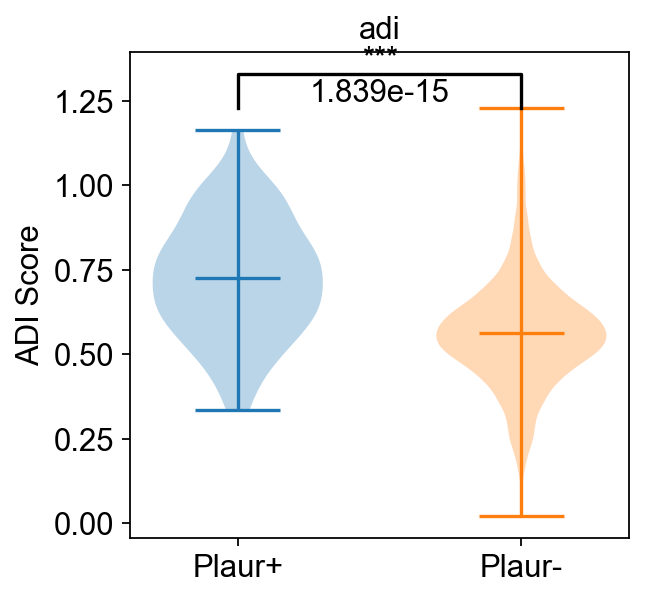

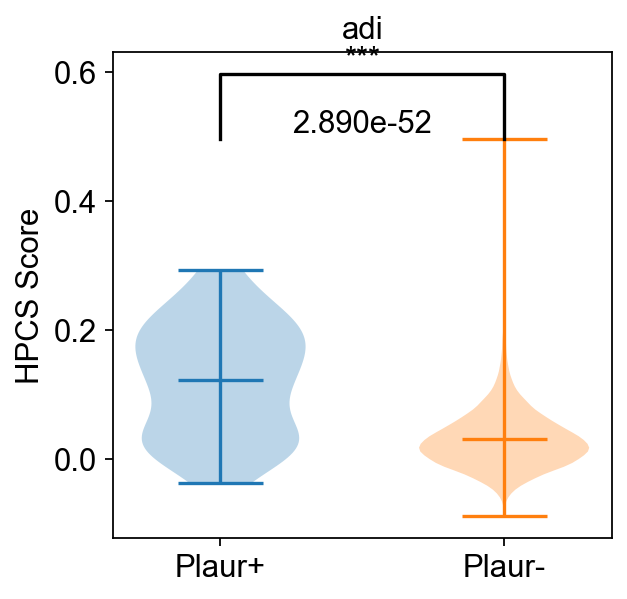

In [54]:
sc.tl.score_genes(adata, adi, score_name="ADI")
key="adi"
outDir = "DTAPlungMouse"
plotScatter(adata.obs, "HPCS", "ADI", key, save=outDir)
rdata = adata.raw.to_adata()
if(isinstance(rdata.X, np.ndarray)):
    slcScore = np.array(rdata[:,rdata.var_names==slc].X).flatten() > 0
    parScore = np.array(rdata[:,rdata.var_names==slc].X).flatten() > 0
else:
    slcScore = np.array(rdata[:,rdata.var_names==slc].X.todense()).flatten() > 0
    parScore = np.array(rdata[:,rdata.var_names==slc].X.todense()).flatten() > 0

plotBoxPlot(adata.obs, "ADI", slcScore, slc, key, save="DTAPlungMouse")
plotBoxPlot(adata.obs, "HPCS", slcScore, slc, key, save="DTAPlungMouse")

plotBoxPlot(adata.obs, "ADI", parScore, "Plaur", key, save="DTAPlungMouse")
plotBoxPlot(adata.obs, "HPCS", parScore, "Plaur", key, save="DTAPlungMouse")

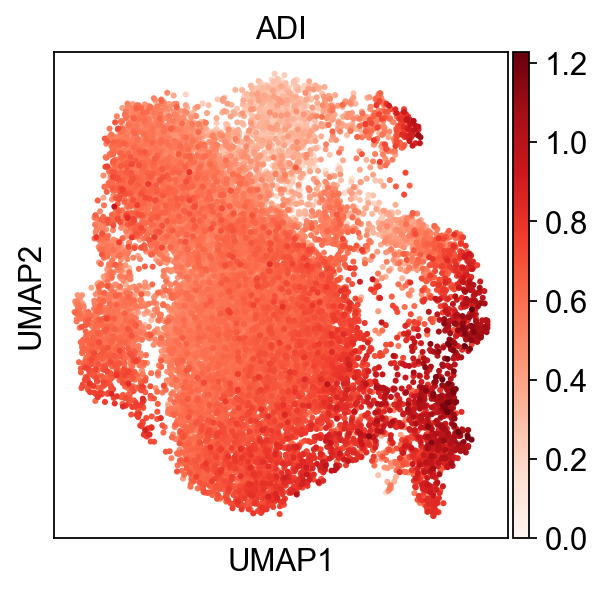

In [55]:
sc.pl.umap(adata, color=["ADI"],cmap="Reds",size=30,vmin=0,
           save=f"Fig5_umap_dapt_ADI.svg")
#os.rename("figures/DTAPlungMouse/umapFig5_umap_dapt_ADI.svg", "figures/Final/genesig/Fig5_umap_dapt_ADI.svg")

In [56]:
pats = pd.read_csv("geneSigs/LUAD/PATS.csv", skiprows=1)["PATS"].dropna()
pats

0        Clu
1      Cldn4
2      Krt18
3      Nupr1
4     S100a6
       ...  
83     Timp2
84      Cfl1
85      Ano1
86     Actn4
87    S100a1
Name: PATS, Length: 88, dtype: object

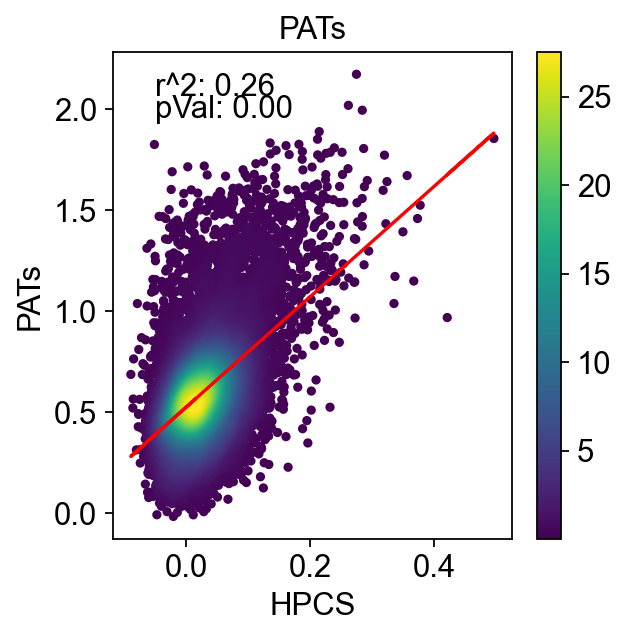

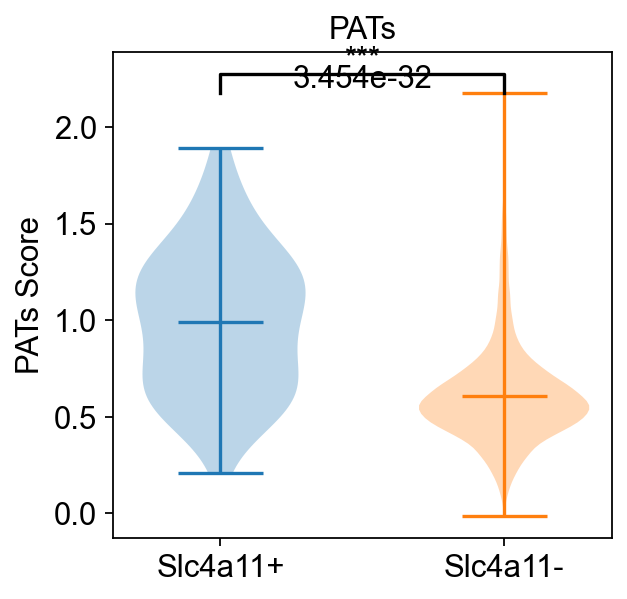

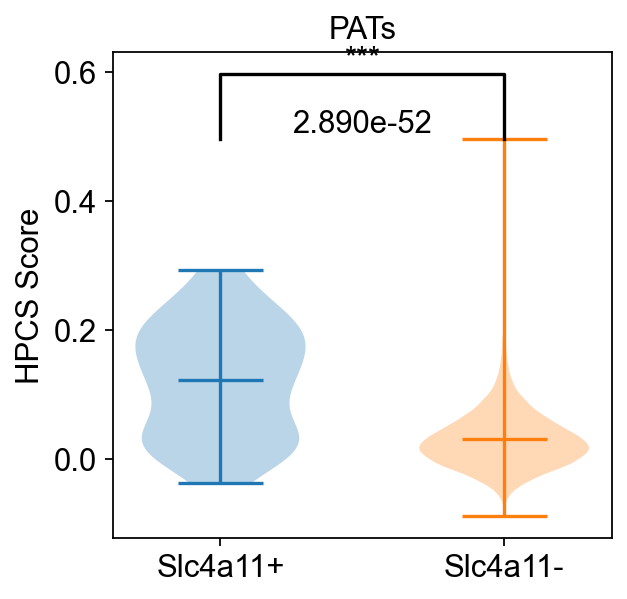

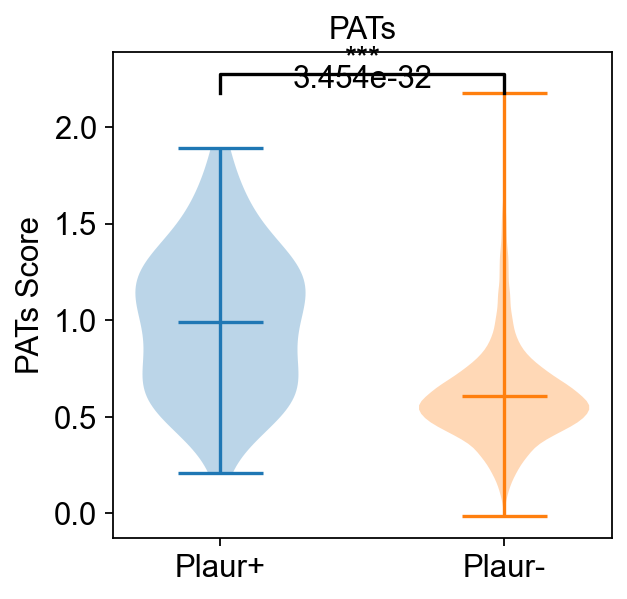

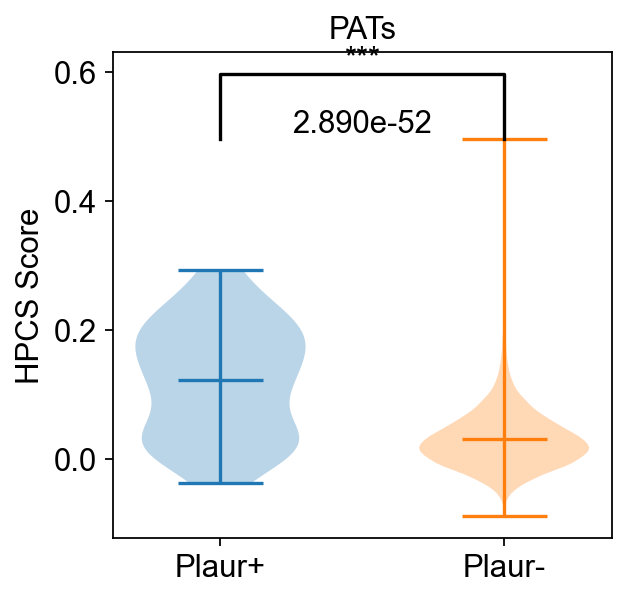

In [57]:
sc.tl.score_genes(adata, pats, score_name="PATs")
key="PATs"
outDir = "DTAPlungMouse"
plotScatter(adata.obs, "HPCS", "PATs", key, save=outDir)
rdata = adata.raw.to_adata()
slc="Slc4a11"
if(isinstance(rdata.X, np.ndarray)):
    slcScore = np.array(rdata[:,rdata.var_names==slc].X).flatten() > 0
    parScore = np.array(rdata[:,rdata.var_names==slc].X).flatten() > 0
else:
    slcScore = np.array(rdata[:,rdata.var_names==slc].X.todense()).flatten() > 0
    parScore = np.array(rdata[:,rdata.var_names==slc].X.todense()).flatten() > 0

plotBoxPlot(adata.obs, "PATs", slcScore, slc, key, save=outDir)
plotBoxPlot(adata.obs, "HPCS", slcScore, slc, key, save=outDir)

plotBoxPlot(adata.obs, "PATs", parScore, "Plaur", key, save=outDir)
plotBoxPlot(adata.obs, "HPCS", parScore, "Plaur", key, save=outDir)

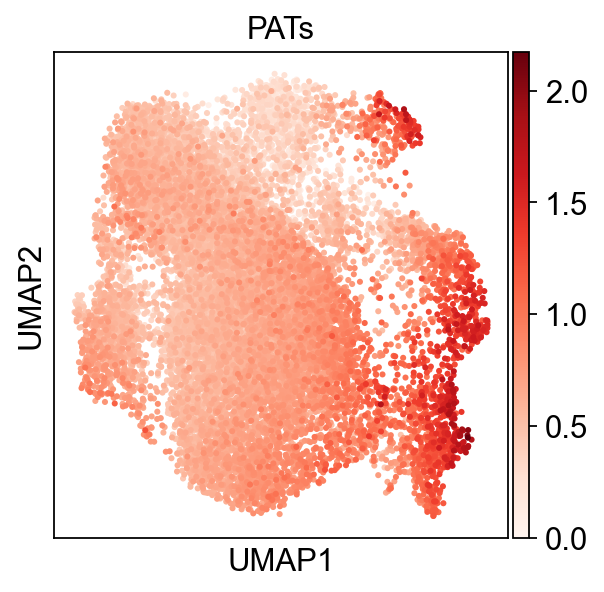

In [58]:
sc.pl.umap(adata, color=["PATs"],cmap="Reds",size=30,vmin=0,
           save=f"Fig5_umap_datp_PATs.svg")

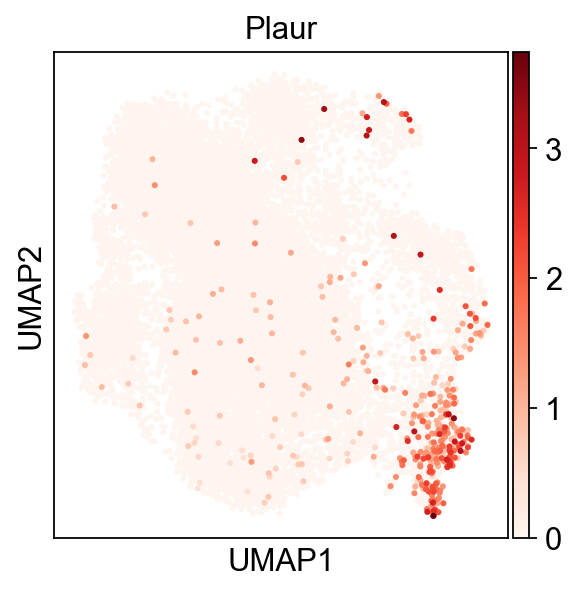

In [59]:
sc.pl.umap(adata, color=["Plaur"],cmap="Reds",size=30,vmin=0,
           save=f"Fig5_umap_datp_Plaur.svg")

In [61]:
adata

AnnData object with n_obs × n_vars = 15518 × 1997
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'tom', 'leiden', 'dapt', 'decoupler', 'AT1', 'DATP', 'Primed AT2', 'Cycling AT2', 'AT2', 'cellstate', 'HPCS', 'ADI', 'PATs'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'tom_colors', 'umap', 'dendrogram_leiden', 'decoupler_colors', 'cellstate_colors'
    obsm: 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [63]:
gSigs = ["DATP", "HPCS", "ADI","PATs"]
genes = ["Slc4a11","Plaur"]
avgScores = np.zeros((len(gSigs),len(genes)*2))
pvalScores = np.zeros((len(gSigs),len(genes)))

for gi, gene in enumerate(genes):

    if(isinstance(rdata.X, np.ndarray)):
        geneExp = np.array(rdata[:,rdata.var_names==gene].X).flatten() > 0
    else:
        geneExp = np.array(rdata[:,rdata.var_names==gene].X.todense()).flatten() > 0

    for gsi,gs in enumerate(gSigs):
            
        geneExpPos = adata.obs[gs][geneExp]
        geneExpNeg = adata.obs[gs][np.logical_not(geneExp)]
        
        avgScores[gsi,gi*2] = np.mean(geneExpPos)
        avgScores[gsi,gi*2+1] = np.mean(geneExpNeg)
        
        t_stat, p_val = stats.ttest_ind(geneExpPos, geneExpNeg)
        pvalScores[gsi,gi] = p_val


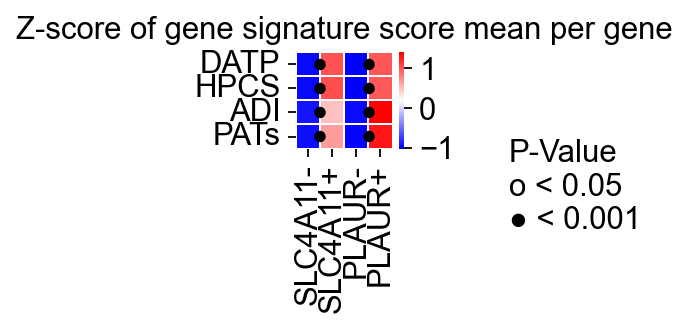

In [76]:
scaler = preprocessing.StandardScaler().fit_transform(avgScores.T)
avgScoresDF = pd.DataFrame(scaler[[1,0,3,2]].T, index=gSigs, columns=['SLC4A11-', 'SLC4A11+', 'PLAUR-','PLAUR+']) #

fig, ax = plt.subplots(figsize=(2,2)) 
plt.grid(False)
sns.heatmap(avgScoresDF, cmap="bwr", xticklabels=True, ax=ax, square=True, linewidths=0.1, cbar=True)#, vmax=-1*np.min(scaler))

for (i, j), significant in np.ndenumerate(pvalScores):
    #print(i,j)
    if significant < 0.001:
        plt.text(j*2 + 1, i + 0.5, "●", color='black', ha='center', va='center', fontsize=12)
    elif significant < 0.05:
        plt.text(j*2 + 1, i + 0.5, 'o', color='black', ha='center', va='center', fontsize=12)
    
ax.set_title(f"Z-score of gene signature score mean per gene")
ax.tick_params(axis='y', labelrotation=0)
fig.text(1.1, 0.3, f"P-Value\no < 0.05\n● < 0.001")
fig.tight_layout()
plt.show()
fig.savefig(f"figures/Fig5_zscore_dapt_GsSlc4a11PalurPval.svg")